# CLASSIFICATION WITH DECISION TREE

We will be using the wine quality data set for these exercises. This data set contains various chemical properties of wine, such as acidity, sugar, pH, and alcohol. It also contains a quality metric (3-9, with highest being better) and a color (red or white). The name of the file is Wine_Quality_Data.csv.

In [1]:
# Importing common libraries 
import pandas as pd
import numpy as np
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings 
warnings.simplefilter(action='ignore', category=FutureWarning)

### 1. IMPORT DATA

In [2]:
data=pd.read_csv("data\\Wine_Quality_Data.csv")

In [3]:
data.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


In [4]:
data.dtypes

fixed_acidity           float64
volatile_acidity        float64
citric_acid             float64
residual_sugar          float64
chlorides               float64
free_sulfur_dioxide     float64
total_sulfur_dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
color                    object
dtype: object

In [5]:
#convert object to numerical category
data['color'] = data.color.replace('white',0).replace('red',1).astype(np.int)

<ipython-input-5-10263b8f986d>:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  data['color'] = data.color.replace('white',0).replace('red',1).astype(np.int)


In [6]:
data

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,1
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,1
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,0
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,0
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,0
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,0


In [7]:
data.quality.value_counts()

6    2836
5    2138
7    1079
4     216
8     193
3      30
9       5
Name: quality, dtype: int64

In [8]:
data['best_quality'] = [ 1 if x>=7 else 0 for x in data.quality] 

In [9]:
data.best_quality

0       0
1       0
2       0
3       0
4       0
       ..
6492    0
6493    0
6494    0
6495    1
6496    0
Name: best_quality, Length: 6497, dtype: int64

In [95]:
#split feature and target
X=data.drop(['quality','best_quality'], axis=1)
y=data.best_quality

### SPLIT TRAIN AND TEST USING STRATIFIEDSHUFFLESPLIT

In [96]:
from sklearn.model_selection import StratifiedShuffleSplit
#Using StratifiedShuffleSplit the proportion of distribution of class labels is almost even between train and test dataset

# Split the data into two parts with 1000 points in the test data
# This creates a generator
strat_shuff_split = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)

# Get the index values from the generator
train_idx, test_idx = next(strat_shuff_split.split(X, y))

# Create the data sets
X_train = data.loc[train_idx, X.columns]
y_train = data.loc[train_idx, 'best_quality']

X_test = data.loc[test_idx, X.columns]
y_test = data.loc[test_idx, 'best_quality']

In [97]:
#Now check the percent composition of each quality level in the train and test data sets. 
y_train.value_counts(normalize=True).sort_index()

0    0.803387
1    0.196613
Name: best_quality, dtype: float64

In [98]:
y_test.value_counts(normalize=True).sort_index()

0    0.80359
1    0.19641
Name: best_quality, dtype: float64

### CREATE DT MODEL

In [99]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(random_state=42)
dt = dt.fit(X_train, y_train)

In [100]:
dt.tree_.node_count, dt.tree_.max_depth

(1003, 22)

In [101]:
y_pred=dt.predict(X_test)

In [102]:
from sklearn.metrics import classification_report
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.91      0.90      0.90      1567
           1       0.60      0.64      0.62       383

    accuracy                           0.85      1950
   macro avg       0.76      0.77      0.76      1950
weighted avg       0.85      0.85      0.85      1950



### EXAMPLE HOW TO DO CROSS-VALIDATION

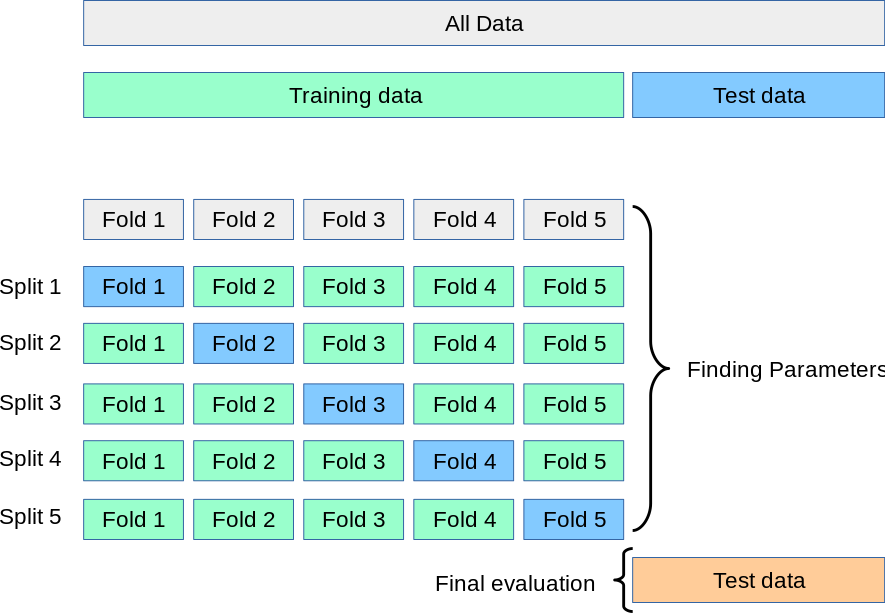

In [103]:
from sklearn.model_selection import cross_val_score

clf = DecisionTreeClassifier(random_state=42)
scores = cross_val_score(clf, X, y, cv=5, scoring='accuracy')
scores.mean()

0.7535704387990763

### GRIDSEARCHCV  to prune tree

In [104]:
from sklearn.model_selection import GridSearchCV
#GridSearchCV is a technique for finding the optimal parameter values from a given set of parameters in a grid. It's essentially a cross-validation technique.

param_grid = {'max_depth':range(1, dt.tree_.max_depth+1, 2),
              'max_features': range(1, len(dt.feature_importances_)+1)}

GR = GridSearchCV(DecisionTreeClassifier(random_state=42),
                  param_grid=param_grid,
                  scoring='accuracy',
                  n_jobs=-1)

GR = GR.fit(X_train, y_train)

In [105]:
GR.best_estimator_

DecisionTreeClassifier(max_depth=21, max_features=5, random_state=42)

In [106]:
GR.best_estimator_.tree_.node_count

1165

In [107]:
y_best_pred=GR.predict(X_test)

In [108]:
report = classification_report(y_test, y_best_pred)
print(report)

              precision    recall  f1-score   support

           0       0.91      0.91      0.91      1567
           1       0.63      0.63      0.63       383

    accuracy                           0.85      1950
   macro avg       0.77      0.77      0.77      1950
weighted avg       0.85      0.85      0.85      1950



### VISUALIZE TREE AND PRUNED TREE


In [109]:
from io import StringIO
from IPython.display import Image, display

from sklearn.tree import export_graphviz

try:
    import pydotplus
    pydotplus_installed = True
    
except:
    print('PyDotPlus must be installed to execute the remainder of the cells associated with this question.')
    print('Please see the instructions for this question for details.')
    pydotplus_installed = False

In [110]:
if pydotplus_installed:
    
    # Create an output destination for the file
    dot_data = StringIO()

    export_graphviz(dt, out_file=dot_data, filled=True)
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())

    # View the tree image
    filename = 'wine_tree.png'
    graph.write_png(filename)
    img = Image(filename=filename)
    display(img)
    
else:
    print('This cell not executed because PyDotPlus could not be loaded.')

In [111]:
if pydotplus_installed:
    
    # Create an output destination for the file
    dot_data = StringIO()

    export_graphviz(GR.best_estimator_, out_file=dot_data, filled=True)
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())

    # View the tree image
    filename = 'wine_tree_prune.png'
    graph.write_png(filename)
    img = Image(filename=filename) 
    display(img)
    
else:
    print('This cell not executed because PyDotPlus could not be loaded.')

### ENSEMBLING A DECISION TREE IN RANDOM FOREST

In [112]:
from sklearn.ensemble import RandomForestClassifier
#is a model that makes predictions based on a number of different models. By combining individual models, the ensemble model tends to be more flexible (less bias) and less data-sensitive (less variance).

forest=RandomForestClassifier(criterion='gini', n_estimators=25, random_state=1, n_jobs=2)

In [113]:
forest.fit(X_train, y_train)

RandomForestClassifier(n_estimators=25, n_jobs=2, random_state=1)

In [114]:
y_test_rf=forest.predict(X_test)

In [115]:
from sklearn.metrics import confusion_matrix
report = classification_report(y_test, y_test_rf)
print (confusion_matrix(y_test,y_test_rf))
print(report)

[[1510   57]
 [ 171  212]]
              precision    recall  f1-score   support

           0       0.90      0.96      0.93      1567
           1       0.79      0.55      0.65       383

    accuracy                           0.88      1950
   macro avg       0.84      0.76      0.79      1950
weighted avg       0.88      0.88      0.87      1950



### DECISION TREE IN REGRESSION

In [116]:
#let's predict the alcohol level
X_reg=data.drop('alcohol',axis=1)
y_reg=data.alcohol

In [117]:
from sklearn.model_selection import train_test_split
#training and testing split using all feature
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X_reg, y_reg, test_size=0.3)

In [118]:
from sklearn.tree import DecisionTreeRegressor

dtr=DecisionTreeRegressor().fit(X_train_reg, y_train_reg)

In [119]:
y_pred_reg=dtr.predict(X_test_reg)

In [120]:
#FUNCTION FOR EVALUATION
import sklearn.metrics as metrics
#evaluation metric
def evaluate(y_actual,y_predict):
    print('R Squared : ',metrics.r2_score(y_actual,y_predict))
    print('Mean Absolute Error : ',metrics.mean_absolute_error(y_actual,y_predict))
    print('Mean Squared Error : ',metrics.mean_squared_error(y_actual,y_predict))
    print('Root Mean Squared Error : ',np.sqrt(metrics.mean_squared_error(y_actual,y_predict)))

In [121]:
evaluate(y_test_reg,y_pred_reg)

R Squared :  0.7729123190227014
Mean Absolute Error :  0.3520777777777778
Mean Squared Error :  0.32130515811965804
Root Mean Squared Error :  0.5668378587565037


In [122]:
df = pd.DataFrame({'Actual': y_test_reg, 'Predicted': y_pred_reg.flatten()})

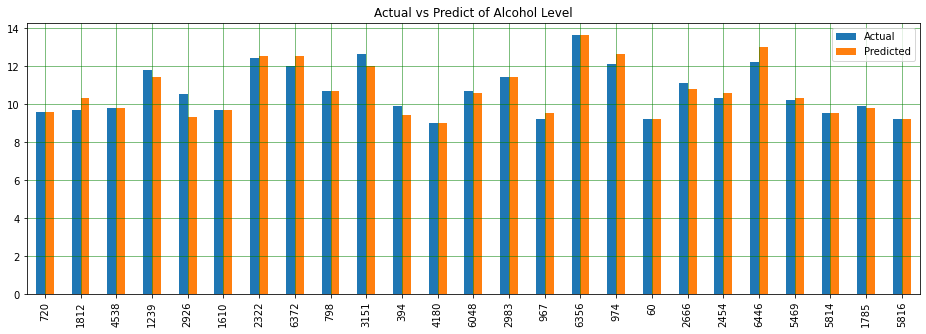

In [123]:
df = df.head(25)
df.plot(kind='bar',figsize=(16,5), title='Actual vs Predict of Alcohol Level')
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.show()